In [47]:
#!pip install pm4py
#!pip install graphviz

In [48]:
#conda install -c conda-forge graphviz


In [49]:
import pm4py
import json  # To store start and end activities as JSON

def import_xes(file_path):
    # Import the XES file
    event_log = pm4py.read_xes(file_path)
    
    # Get start and end activities
    start_activities = pm4py.get_start_activities(event_log)
    end_activities = pm4py.get_end_activities(event_log)

    # Print the results
    print("Start activities: {}\nEnd activities: {}".format(start_activities, end_activities))

    # Store the results
    pm4py.write_xes(event_log, "event_log.xes")  # Save the event log to a new XES file
    with open("start_activities.json", "w") as start_file:
        json.dump(start_activities, start_file, indent=4)
    with open("end_activities.json", "w") as end_file:
        json.dump(end_activities, end_file, indent=4)

    # Return the data for further processing
    return event_log, start_activities, end_activities

if __name__ == "__main__":
    # File path to the XES file
    file_path = "PrepaidTravelCost.xes"

    # Import the XES file and store the data
    event_log, start_activities, end_activities = import_xes(file_path)


parsing log, completed traces ::   0%|          | 0/2099 [00:00<?, ?it/s]

Start activities: {'Permit SUBMITTED by EMPLOYEE': 1859, 'Request For Payment SUBMITTED by EMPLOYEE': 233, 'Request For Payment SAVED by EMPLOYEE': 7}
End activities: {'Permit REJECTED by MISSING': 10, 'Payment Handled': 1970, 'Request For Payment REJECTED by MISSING': 7, 'Request For Payment REJECTED by EMPLOYEE': 72, 'Request For Payment SAVED by EMPLOYEE': 20, 'Permit FINAL_APPROVED by DIRECTOR': 6, 'Permit FINAL_APPROVED by SUPERVISOR': 12, 'Request For Payment REJECTED by ADMINISTRATION': 1, 'Request Payment': 1}


exporting log, completed traces ::   0%|          | 0/2099 [00:00<?, ?it/s]

In [50]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_alpha(event_log)

# Visualize the Petri net
gviz = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)


In [51]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0,
 'average_trace_fitness': 0.45522736917670575,
 'log_fitness': 0.4702681384715757,
 'percentage_of_fitting_traces': 0.0}

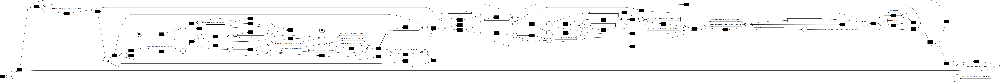

In [52]:

#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [53]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 3.906622201048118,
 'average_trace_fitness': 0.9863028330128115,
 'log_fitness': 0.9865754284763762,
 'percentage_of_fitting_traces': 3.906622201048118}

The perc_fit_traces is not as as important compared to average_trace_fitness, because overall this model should be the best due to its average_trace_fitness.
It just isn't correct entirely, but has parts that are in error. Overall fitness is still very good.

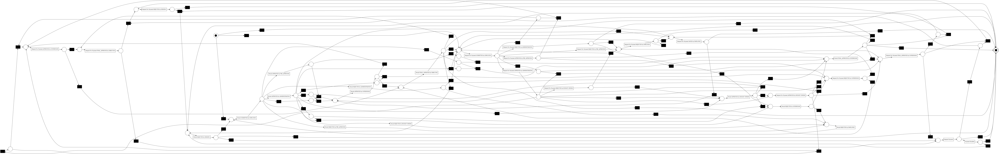

In [54]:
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(event_log)

# Visualize the Petri net
gviz_Heur = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [55]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 23.392091472129586,
 'average_trace_fitness': 0.8940378268550863,
 'log_fitness': 0.9016178004778507,
 'percentage_of_fitting_traces': 23.392091472129586}